In [1]:
from vizsequence import viz_sequence
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
import pybedtools as pbt

In [2]:
%cd ../data/gkmexplain-ms

/Volumes/Private/Ciofani Lab/NGS_Data/projects/human-th-ms/data/gkmexplain-ms


In [3]:
from Bio import SeqIO
from Bio import Seq

In [4]:
def oneHot(seq):
    mappings = {"A" : [1,0,0,0],
               "C" : [0,1,0,0],
               "G" : [0,0,1,0],
               "T" : [0,0,0,1]}
    
    result = []
    
    for letter in seq:
        result.append(mappings[letter])
    
    return(np.array(result))

## Retrieve and organize the LD-expanded SNPs

In [5]:
snp_info = pd.read_table("../snp_data/ld_expansion/ensembl_ldlink_final_snp_info.tab")

This table has some duplicates because some GWAS lead SNPs will pair with the same LD SNPs. We need to remove them because the effect of the SNP will not depend on which GWAS SNP tagged it. We'll also get rid of the LD-specific information to make the DF easier to work with.

In [6]:
snp_info = snp_info.drop_duplicates(['snp_id'])
snp_info = snp_info.drop(columns=['query', 'r2', 'd_prime', 'location', 'synonyms', 'result'])
snp_info = snp_info.rename(columns={'snp_id' : 'rsid'}).set_index('rsid')

In [7]:
snp_info.head()

,MAF,minor_allele,consequence,allele_string,chrom,start,end
rsid,,,,,,,
rs849333,0.3233,G,intron_variant,A/C/G,chr7,28180193.0,28180193.0
rs1476454,0.2720,G,intron_variant,A/G,chr7,116717314.0,116717314.0
rs2237714,0.3235,C,intron_variant,T/C,chr7,116715242.0,116715242.0
rs12691874,0.3147,A,TF_binding_site_variant,G/A,chr2,136122904.0,136122904.0
rs56046653,NaN,NaN,intergenic_variant,TGTG/TG,chr2,136129006.0,136129009.0


gkmExplain works for SNPs by perturbing the central base pair. Obviously this only works for true *single* nucleotide variants, so we need to filter out the indels.

In [8]:
# Get the ref and alternate alleles
snp_info['ref_allele'] = snp_info.loc[:,"allele_string"].str.split("/", expand=True)[0]
snp_info['alt_allele'] = snp_info.loc[:,"allele_string"].str.split("/", expand=True)[1]
snp_info.head()

,MAF,minor_allele,consequence,allele_string,chrom,start,end,ref_allele,alt_allele
rsid,,,,,,,,,
rs849333,0.3233,G,intron_variant,A/C/G,chr7,28180193.0,28180193.0,A,C
rs1476454,0.2720,G,intron_variant,A/G,chr7,116717314.0,116717314.0,A,G
rs2237714,0.3235,C,intron_variant,T/C,chr7,116715242.0,116715242.0,T,C
rs12691874,0.3147,A,TF_binding_site_variant,G/A,chr2,136122904.0,136122904.0,G,A
rs56046653,NaN,NaN,intergenic_variant,TGTG/TG,chr2,136129006.0,136129009.0,TGTG,TG


This method is obviously problematic for multi-allelic variants, because I am only evaluating the second-most commong allele in the allele string. However, with the exception of the original GWAS tagging SNPs, I have no way of knowing which alternate allele is *actually* associated with the tagging SNP.

In [9]:
# Filter indels
snp_info['snv'] = snp_info.ref_allele.isin(['A','C', 'G', 'T']) & snp_info.alt_allele.isin(['A','C', 'G', 'T'])

In [10]:
snp_info.head()

,MAF,minor_allele,consequence,allele_string,chrom,start,end,ref_allele,alt_allele,snv
rsid,,,,,,,,,,
rs849333,0.3233,G,intron_variant,A/C/G,chr7,28180193.0,28180193.0,A,C,True
rs1476454,0.2720,G,intron_variant,A/G,chr7,116717314.0,116717314.0,A,G,True
rs2237714,0.3235,C,intron_variant,T/C,chr7,116715242.0,116715242.0,T,C,True
rs12691874,0.3147,A,TF_binding_site_variant,G/A,chr2,136122904.0,136122904.0,G,A,True
rs56046653,NaN,NaN,intergenic_variant,TGTG/TG,chr2,136129006.0,136129009.0,TGTG,TG,False


### Generate FASTA sequences with 25bp flanks for each SNP

We will generate 51bp sequences centered on the SNP, then gkmexplain will test all substitutions at the central (SNP) position and score them with the model.

In [11]:
# Generate a BED file to extract sequences with
snv_bed = snp_info[snp_info.snv].reset_index()[['chrom', 'start', 'end', 'rsid']]
snv_bed['start'] = snv_bed['start'] - 26
snv_bed['end'] = snv_bed['end'] + 25
snv_bed[['start', 'end']] = snv_bed[['start', 'end']].astype(int)
snv_bed.to_csv("snv_51bp_ref.bed", header=None, index=None, sep="\t")

In [12]:
%%bash
bedtools getfasta -name -fi GRCh38.primary_assembly.genome.fa -bed snv_51bp_ref.bed > snp_51bp_ref.fa

In [12]:
snp = list(SeqIO.parse("snp_51bp_ref.fa", format="fasta"))

snp_1h_name = [[oneHot(record.seq), record.name] for record in snp]

In [13]:
ref_seqs = pd.DataFrame([(rec.name, str(rec.seq)) for rec in snp], 
                       columns=['rsid', 'ref']).drop_duplicates(['rsid']).set_index("rsid")

In [14]:
ref_seqs.head()

,ref
rsid,
rs849333,GCGCTCCCCGCTCCCACCACTTCGCAGCCCGCGTGCACGCCCCTGA...
rs1476454,CAGTAAAGAGTTAAAATATGTCTATAAGAAACAGCGCCAGACCCTG...
rs2237714,GGCTGAAAACAACAGAAATTTATCCTCACATGGTTCTGGAGGCCAG...
rs12691874,AGACAGCTATATAAAAAGAGGAAGCGCCTAGAGCCCTGTGGACTGT...
rs3863021,CAGCTACTTGGGAGGCTGAGGCAGGAGAATGGTGTGAACCCAGGAG...


In [15]:
snp_info = snp_info.drop(columns=['chrom', 'start', 'end'])

In [16]:
snp_combined = ref_seqs.merge(snp_info, left_index=True, right_index=True)

In [17]:
snp_combined.shape

(9309, 8)

### Generate alternate alleles
This helps to verify our coordinates were set correctly and is necessary later for visualizing base-wise gkmexplain importance scores to see how SNPs disrupt TF motifs.

In [18]:
def generateAltAllele(row):
    ref_seq = row['ref']
    alt_bases = row['alt_allele']
    if alt_bases == '-':
        alt_bases = ""
    alt_seq = ref_seq[:25] + alt_bases + ref_seq[26:]
    return alt_seq

In [19]:
snp_combined['alt'] = snp_combined.apply(generateAltAllele, axis=1)

In [20]:
def checkSeqComp(row):
    try:
        assert row['ref'] == row['alt']
    except:
        print(row['ref'], row['ref_allele'])
        print(row['alt'])
        

In [21]:
def checkBases(seq):
    for base in seq:
        assert base in 'ACGT'

In [22]:
snp_combined['alt'].apply(len)

rsid
rs849333      51
rs1476454     51
rs2237714     51
rs12691874    51
rs3863021     51
              ..
rs4240675     51
rs6982606     51
rs6984212     51
rs12543308    51
rs1611338     51
Name: alt, Length: 9309, dtype: int64

In [23]:
# Write the alternate alleles to a fasta file
fh_alt = open("snp_51bp_alt.fa", "w")
for ix, row in snp_combined.iterrows():
    fh_alt.write(">" + ix + "-alt" + "\n")
    fh_alt.write(row['alt'] + "\n")
fh_alt.close()

Now we need to **proceed to gkmexplain scoring** by moving the ref and alt allele FASTA files to the cluster, and running gkmexplain.

`rsync -avz snp_51bp_*.fa jdw54@dcc-slogin.oit.duke.edu:~/projects/human-th-ms/data/gkmexplain-ms/`

## Analyze gkmexplain results

When it's done, bring it back: `rsync -avz jdw54@dcc-slogin.oit.duke.edu:~/projects/human-th-ms/data/gkmexplain-ms/ ./ `

In [24]:
import os
import re

In [25]:
scorefiles = [x for x in os.listdir() if x.endswith(".gkmexplain")]
name_re = re.compile(r"snp_51bp_ref.fa.(Th\d+_[A-Za-z]+)_.*")
re.search(name_re, scorefiles[1]).group(1)

'Th17_Std'

In [26]:
def extractPtbForAlt(row, file):
    '''Given a row in the table below, extracts the perturbation score for the alt-allele'''
    try:
        alt = snp_combined['alt_allele'][row['rsid']]
        one_h = 0
        if alt == 'A':
            one_h = 0
        elif alt == 'C':
            one_h = 1
        elif alt == 'G':
            one_h = 2
        elif alt == 'T':
            one_h = 3
        else:
            raise(ValueError("This is not an ACGT base!"))
        return row[file].split(",")[one_h]
    except:
        return np.nan

In [27]:
# This loop reads in the files, reformats, and extracts the perturbation score of interest
tables = []
name_re = re.compile(r"snp_51bp_ref.fa.(Th\d+_[A-Za-z]+)_.*")
for ix, file in enumerate(scorefiles):
    name = re.search(name_re, file).group(1)
    begin = pd.read_table(file, header=None)
    begin.columns = ("rsid", "base_score", name)
    begin[name] = begin.apply(lambda x: extractPtbForAlt(x, name), axis=1)
    if ix == 0:
        begin.set_index('rsid')
    else:
        begin.drop(columns=['rsid'], inplace=True)
    begin.drop(columns=['base_score'], inplace=True)
    tables.append(begin)
    
all_gkm_scores = pd.concat(tables, axis=1, sort=False).set_index('rsid')
all_gkm_scores = all_gkm_scores.astype('float64')

In [28]:
all_gkm_scores.head()

,Th17_CC,Th17_Std,Th1_Std,Th1_CC
rsid,,,,
rs849333,-0.050221,0.051381,0.092307,-0.087583
rs1476454,0.089031,-0.000864,0.300962,0.005057
rs2237714,0.070693,-0.036807,0.022778,0.045988
rs12691874,-0.399617,-0.423966,-0.392666,-0.119412
rs3863021,0.048618,0.091010,0.145581,0.162473


In [29]:
snp_51_per = all_gkm_scores.merge(snp_combined[['ref_allele', 'alt_allele', 'minor_allele']], left_index=True, right_index=True)

In [30]:
snp_51_per.sort_values("Th17_Std").head()

,Th17_CC,Th17_Std,Th1_Std,Th1_CC,ref_allele,alt_allele,minor_allele
rsid,,,,,,,
rs2089657,-0.999977,-1.47694,-1.68459,-0.852464,C,T,T
rs2664280,-0.886334,-1.37068,-1.21816,-0.796789,A,T,T
rs8067286,-1.074540,-1.32547,-1.00241,-0.869361,A,G,A
rs1557351,-0.641147,-1.28062,-1.08298,-0.608088,T,C,C
rs2136942,-0.675575,-1.08725,-1.19102,-0.517738,T,G,G


### What is the relationship between perturbation scores from the different cell type models?

In [34]:
import scipy.cluster as clust

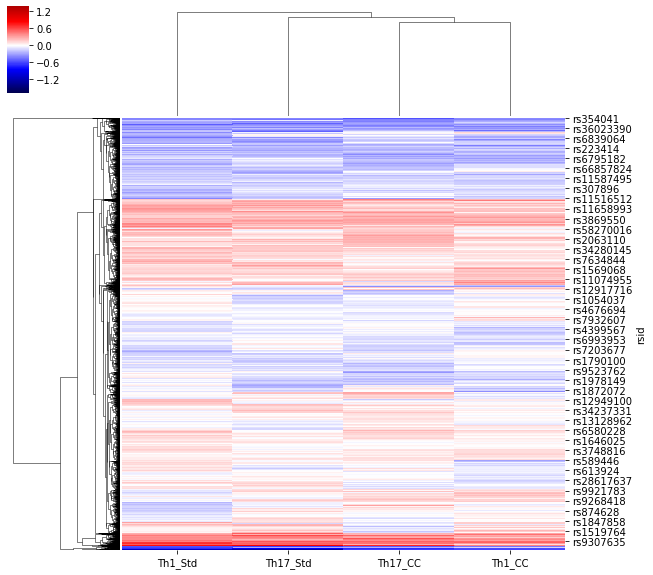

In [35]:
sns.clustermap(snp_51_per.iloc[:,:4].dropna(), cmap="seismic", center=0)

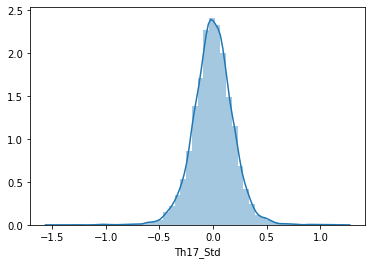

In [36]:
sns.distplot(snp_51_per.Th17_Std)

### Add looping data

In [35]:
looping = pd.read_table("../snp_data/all_interactions_with_snp.tab")
looping = looping.dropna(subset=['name_snp'])
looping = looping.rename(columns={'name_snp' : 'rsid'})

In [36]:
sum(looping.gene_symbol.isna())

99

In [37]:
looping_pert = snp_51_per.merge(looping, left_index=True, right_on='rsid')
looping_pert[['Th17_Std', 'Th1_Std']] = looping_pert[['Th17_Std', 'Th1_Std']].astype('float64')

In [38]:
all_perts = snp_51_per.merge(looping[['rsid', 'gene_symbol', 'name_atac']], left_index=True, right_on='rsid', how='left')

In [40]:
def combine_gene_names(x):
    try:
        return '|'.join(list(x))
    except:
        return np.nan

In [41]:
all_perts.groupby('rsid').agg({'gene_symbol' : combine_gene_names,
                               'name_atac' : combine_gene_names,
                                   'Th17_Std' : np.mean,
                                   'Th1_Std' : np.mean,
                                  'Th17_CC' : np.mean,
                                  'Th1_CC' : np.mean}).to_csv("pert_scores_by_snp.csv")

In [42]:
candidates = looping_pert[['rsid','gene_symbol','is_looped','is_lead_snp','Th17_Std', 'Th1_Std']].sort_values('Th17_Std')

In [43]:
candidates.tail()

,rsid,gene_symbol,is_looped,is_lead_snp,Th17_Std,Th1_Std
2124,rs11783772,SLA,True,False,0.918421,0.79848
2119,rs11783772,TG,True,False,0.918421,0.79848
2114,rs11783772,AF305872.2,True,False,0.918421,0.79848
124,rs10494343,AL138930.1,True,False,0.990132,1.16342
127,rs10494343,CD84,True,False,0.990132,1.16342


In [45]:
candidates_condensed = candidates.groupby('rsid').agg({'gene_symbol' : combine_gene_names,
                                   'Th17_Std' : np.mean,
                                   'Th1_Std' : np.mean})

In [67]:
candidates_condensed.head()

,gene_symbol,Th17_Std,Th1_Std
rsid,,,
rs10065637,ANKRD55,-0.334654,-0.467816
rs10133498,GNG2|PTGER2,-0.449706,-0.592503
rs1019527,WWOX|RNA5SP431|CDYL2|AC009070.1|AC092718.2|AC0...,0.263608,0.206536
rs10207197,MGAT5,0.127107,0.071866
rs10209615,SP110|SP140,0.004779,0.080280


Which mutations have a perturbation score that is particularly different from rest? I.e. which of these have high Z-scores? We want to have some statistical cutoff to decide where to threshold. Here, I'll use a simple bootstrapping procedure to decide where to make the distinction. I am assuming that most of these SNPs are inconsequential and normally-distributed, then taking 10000 random samples of our data to determine a null Z-distribution. Finally, using the mean and stdev derived from this bootstrapped distribution, we find the upper and lower bounds of the 95th percentile of most extreme values (kind of like p=0.05) and consider those SNPs as the significant outliers.

In [46]:
from sklearn.utils import resample
# from scipy.stats

In [47]:
# Use bootsttrapping to estimate mean and stdev of perturbation score values
def bootstrap(x, iterations=100):
    means_ = []
    stdevs_ = []
    for i in range(iterations):
        sample = resample(x)
        means_.append(np.mean(sample))
        stdevs_.append(np.std(sample))
    return np.mean(means_), np.mean(stdevs_)

In [48]:
def find_cutoffs(data):
    b_mean, b_std = bootstrap(data, 10000)

    z_pos = b_mean + (1.95*b_std)
    z_neg = b_mean - (1.95*b_std) 

    f, ax = plt.subplots(1,1,figsize=(4,3), dpi=100)
    sns.distplot(data, hist=None)
    np.std(data)
    ax.axvline(x=z_neg, ls='dotted', color = "black")
    ax.axvline(x=z_pos, ls='dotted', color = "black")
    ax.fill_between(x= ax.lines[0].get_xdata(), y1=ax.lines[0].get_ydata(), color=sns.color_palette()[0], alpha=1)
    sns.distplot(np.random.normal(loc=b_mean, scale=b_std, size=10000), 
                 ax=ax, color=sns.color_palette()[1], hist=None, kde_kws={'linestyle' : "dashed"})
    ax.text(x=-1, y=1, 
            s='{} SNPs'.format(sum(data < z_neg)),
           horizontalalignment="center", color=sns.color_palette()[1])
    ax.text(x=1, y=1, 
            s='{} SNPs'.format(sum(data > z_pos)),
           horizontalalignment="center", color=sns.color_palette()[1])
    ax.set_xlabel("SNP Perturbation Score")
    ax.set_ylabel("Normalized Density")
    ax.set_title("Perturbation scores for SNPs\noverlapping Th cell ATAC peaks")
    ax.legend(handles=[ax.lines[0], ax.lines[3]], labels=["Data", "BS Z-dist"])
    f.tight_layout()
    print('Points scoring above {} or below {} are significantly unusual'.format(z_pos, z_neg))
    return (z_neg,z_pos)

Points scoring above 0.3937400295496039 or below -0.38326866406845655 are significantly unusual
Points scoring above 0.40561483801714265 or below -0.41790616734438796 are significantly unusual


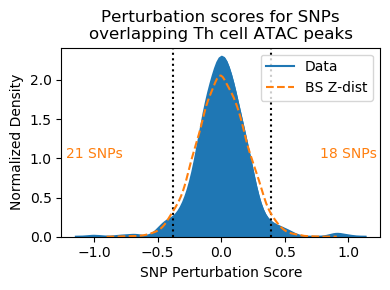

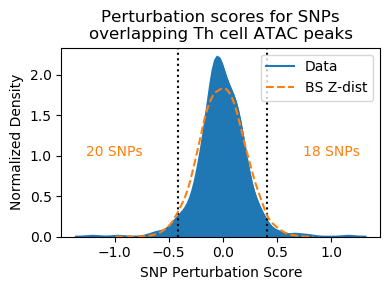

In [49]:
th17_lower, th17_upper = find_cutoffs(candidates_condensed.Th17_Std)
selected_snps_th17 = candidates_condensed.query('Th17_Std < {} | Th17_Std > {}'.format(th17_lower, th17_upper)).sort_values('Th17_Std')

th1_lower, th1_upper = find_cutoffs(candidates_condensed.Th1_Std)
selected_snps_th1 = candidates_condensed.query('Th1_Std < {} | Th1_Std > {}'.format(th1_lower, th1_upper)).sort_values('Th1_Std')

Here are the SNP-gene associations for the SNPs with the most likely regulatory impact:

Let's have a closer look at the importance scores for some of these to see what's going on!

In [50]:
def readImpScores(filename):
    with open(filename) as f:
        lines = f.readlines()
        impscores = [
            np.array( [[float(z) for z in y.split(",")] for y in line.rstrip().split("\t")[2].split(";")])
            for line in lines
        ]
        seqnames = [
            np.array( [line.rstrip().split("\t")[0]])
            for line in lines
        ]
        ov_scores = [
            np.array( [line.rstrip().split("\t")[1]])
            for line in lines
        ]
    return seqnames, impscores
    

In [51]:
def impscores_to_df(condition):
    names_ref, imps_ref = readImpScores("snp_51bp_ref.fa.{}_idr3_500_t3_c10_g2_l10_k6.model.txt.impscores".format(condition))
    names_alt, imps_alt = readImpScores("snp_51bp_alt.fa.{}_idr3_500_t3_c10_g2_l10_k6.model.txt.impscore".format(condition))
    # Check that they are in the same order
    assert [str(x[0]).split("-")[0] for x in names_ref] == [str(x[0]).split("-")[0] for x in names_alt]
    names_trimmed = [str(x[0]).split("-")[0] for x in names_ref]
    # Build dict of impscores
    scores = {}

    for name, refscore, altscore in zip(names_trimmed, imps_ref, imps_alt):
        scores[name] = {"refscore" : refscore,
                       "altscore" : altscore}

    scores = pd.DataFrame().from_dict(scores, orient='index')
    
    return scores

In [52]:
# names_ref, imps_ref = readImpScores("snp_51bp_ref.fa.Th17_Std_idr3_500_t3_c10_g2_l10_k6.model.txt.impscores")
# names_alt, imps_alt = readImpScores("snp_51bp_alt.fa.Th17_Std_idr3_500_t3_c10_g2_l10_k6.model.txt.impscore")

In [53]:
# Check that they are in the same order
# [str(x[0]).split("-")[0] for x in names_ref] == [str(x[0]).split("-")[0] for x in names_alt]

In [54]:
# names_trimmed = [str(x[0]).split("-")[0] for x in names_ref]

In [55]:
# # Build dict of impscores
# scores = {}

# for name, refscore, altscore in zip(names_trimmed, imps_ref, imps_alt):
#     scores[name] = {"refscore" : refscore,
#                    "altscore" : altscore}
    
# scores = pd.DataFrame().from_dict(scores, orient='index')

In [56]:
scores_th17_std = impscores_to_df('Th17_Std')
scores_th1_std = impscores_to_df('Th1_Std')

In [57]:
selected_snps_th17 = selected_snps_th17.merge(scores_th17_std, left_index=True, right_index=True).rename(columns={'Th17_Std' : 'pert_score'})
selected_snps_th1 = selected_snps_th1.merge(scores_th1_std, left_index=True, right_index=True).rename(columns={'Th1_Std' : 'pert_score'})

In [58]:
def plot_impscores(selected, filename="fig.pdf"):
#     selected = selected_snps
    # selected = selected_snps_Tdown_allup.sort_values('corrected_pert_score', ascending=False)[:5]

    # # Build dict of impscores
    # scores = {}

    # for name, refscore, altscore in zip(names_trimmed, imps_ref, imps_alt):
    #     scores[name] = {"refscore" : refscore,
    #                    "altscore" : altscore}

    # Plot based on table

    f, axs = plt.subplots(len(selected) * 2, 1, figsize=(15, len(selected)*2*1.5), dpi=200, sharex=True)
    i = 0
    for ix, row in selected.iterrows():
        name = str(ix)
        ymin = min(np.min(row['refscore']), np.min(row['altscore']))*1.1
        ymax = max(np.max(row['refscore']), np.max(row['altscore']))*1.1
        axs[i].set_title(ix + "-ref ::" + ' :: '.join(str(x) for x in row[['pert_score', 'gene_symbol']]))
        viz_sequence.plot_weights_given_ax(ax = axs[i], array=row['refscore'])
        axs[i].axvline(x=26, ls="dotted", color="orange")
        axs[i].set_ylim(ymin, ymax)
        i += 1
        viz_sequence.plot_weights_given_ax(ax = axs[i], array=row['altscore'])
        axs[i].axvline(x=26, ls="dotted", color="orange")
        axs[i].set_ylim(ymin, ymax)
        i += 1

#     f.tight_layout()

    f.savefig(filename)

In [61]:
def fix_long_name(x):
    x = str(x)
    y = x.split("|")
    if len(y) > 10 and isinstance(y, list):
        y.insert(10, "\n")
        return '|'.join(y)
    else:
        return x
            

In [62]:
selected_snps_th1.gene_symbol = selected_snps_th1.gene_symbol.apply(fix_long_name)

In [63]:
plot_impscores(selected_snps_th1, "th1_atac_linked_scores.pdf")

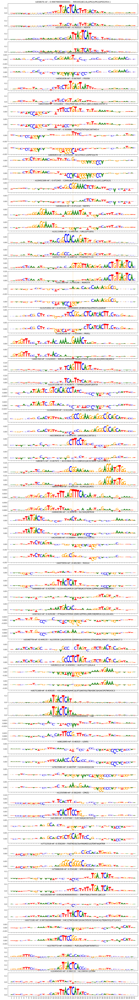

In [64]:
plot_impscores(selected_snps_th17, "th17_atac_linked_scores.pdf")

In [65]:
selected_unlinked = snp_51_per.loc[~snp_51_per.index.isin(candidates_condensed.index)]
selected_unlinked_th1 = selected_unlinked.merge(scores_th1_std, left_index=True, right_index=True).sort_values('Th1_Std', ascending=False)

selected_unlinked_th17 = selected_unlinked.merge(scores_th1_std, left_index=True, right_index=True).sort_values('Th17_Std', ascending=False)
selected_unlinked_th17 = selected_unlinked_th1.rename(columns={'Th17_Std' : 'pert_score'})

KeyError: "None of [Index(['pert_score', 'gene_symbol'], dtype='object')] are in the [index]"

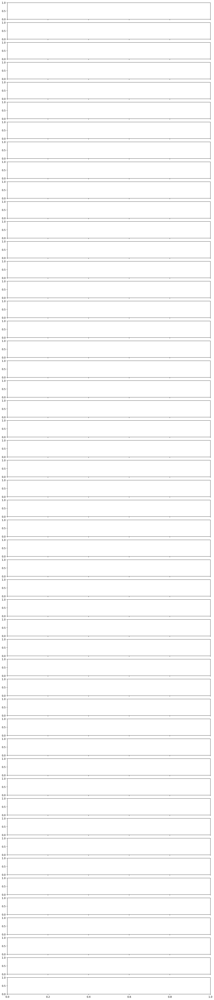

In [66]:
plot_impscores(selected_unlinked_th1.iloc[:25,:], "top_25_snp_perturbation_unlinked_th1.pdf")

In [ ]:
plot_impscores(selected_unlinked_th17.iloc[:25,:], "top_25_snp_perturbation_unlinked_th17.pdf")